In [136]:
from typing import Dict

from tempfile import gettempdir
import matplotlib.pyplot as plt
import numpy as np
import torch
from torch import nn, optim
from torch.utils.data import DataLoader
from torchvision.models.resnet import resnet50
from tqdm import tqdm

from l5kit.configs import load_config_data
from l5kit.data import LocalDataManager, ChunkedDataset
from l5kit.dataset import AgentDataset, EgoDataset
from l5kit.rasterization import build_rasterizer
from l5kit.evaluation import write_pred_csv, compute_metrics_csv, read_gt_csv, create_chopped_dataset
from l5kit.evaluation.chop_dataset import MIN_FUTURE_STEPS
from l5kit.evaluation.metrics import neg_multi_log_likelihood, time_displace
from l5kit.geometry import transform_points
from l5kit.visualization import PREDICTED_POINTS_COLOR, TARGET_POINTS_COLOR, draw_trajectory
from prettytable import PrettyTable
from pathlib import Path
import os
import pandas as pd
import argparse

In [138]:
# initialize
module_path = f'experiment.{exp_id}'
exec(f'from {module_path}.config import *', globals()) 
exec(f'from {module_path}.model import LyftModel', globals())
exec(f'from {module_path}.model import forward', globals())

In [139]:
# load eval data
DIR_INPUT = cfg["data_path"]
os.environ["L5KIT_DATA_FOLDER"] = DIR_INPUT
dm = LocalDataManager(None)
rasterizer = build_rasterizer(cfg, dm)

num_frames_to_chop = 100
eval_cfg = {
    "key": "scenes/sample.zarr",
    "batch_size": 12,
    "shuffle": False,
    "num_workers": 4}

eval_base_path = create_chopped_dataset(dm.require(eval_cfg["key"]), 
                                        cfg["raster_params"]["filter_agents_threshold"], 
                                        num_frames_to_chop, 
                                        cfg["model_params"]["future_num_frames"], MIN_FUTURE_STEPS)

eval_zarr_path = str(Path(eval_base_path) / Path(dm.require(eval_cfg["key"])).name)
eval_mask_path = str(Path(eval_base_path) / "mask.npz")
eval_gt_path = str(Path(eval_base_path) / "gt.csv")

eval_zarr = ChunkedDataset(eval_zarr_path).open()
eval_mask = np.load(eval_mask_path)["arr_0"]
eval_dataset = AgentDataset(cfg, eval_zarr, rasterizer, agents_mask=eval_mask)
eval_dataloader = DataLoader(eval_dataset, shuffle=eval_cfg["shuffle"], batch_size=eval_cfg["batch_size"], 
                             num_workers=eval_cfg["num_workers"])
print(eval_dataset)

copying: 100%|██████████| 100/100 [00:01<00:00, 77.32it/s]
/home/axot/anaconda3/lib/python3.8/site-packages/l5kit/evaluation/extract_ground_truth.py:59: RuntimeWarning: you're running with a custom agents_mask
  dataset = AgentDataset(cfg=cfg, zarr_dataset=zarr_dataset, rasterizer=rasterizer, agents_mask=agents_mask)
extracting GT: 100%|██████████| 480/480 [00:01<00:00, 242.43it/s]


+------------+------------+------------+---------------+-----------------+----------------------+----------------------+----------------------+---------------------+
| Num Scenes | Num Frames | Num Agents | Num TR lights | Total Time (hr) | Avg Frames per Scene | Avg Agents per Frame | Avg Scene Time (sec) | Avg Frame frequency |
+------------+------------+------------+---------------+-----------------+----------------------+----------------------+----------------------+---------------------+
|    100     |   10000    |   751440   |     130740    |       0.28      |        100.00        |        75.14         |        10.00         |        10.00        |
+------------+------------+------------+---------------+-----------------+----------------------+----------------------+----------------------+---------------------+


<ipython-input-139-3c52367f2a50>:25: RuntimeWarning: you're running with a custom agents_mask
  eval_dataset = AgentDataset(cfg, eval_zarr, rasterizer, agents_mask=eval_mask)


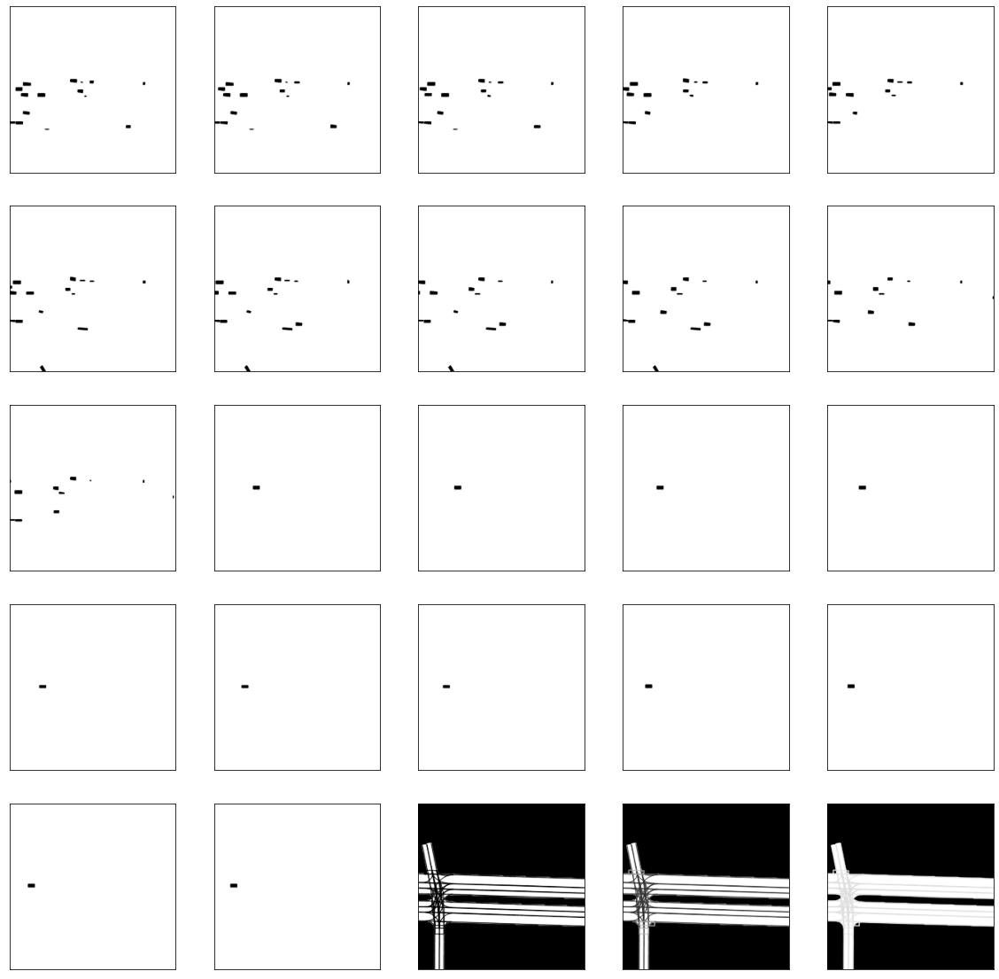

In [140]:
f, ax = plt.subplots(5, 5, figsize=(20, 20))
ax = ax.flatten()

for i in range(25):
    ax[i].imshow(eval_dataset[100]['image'][i], cmap='Greys')
    ax[i].get_xaxis().set_visible(False)
    ax[i].get_yaxis().set_visible(False)

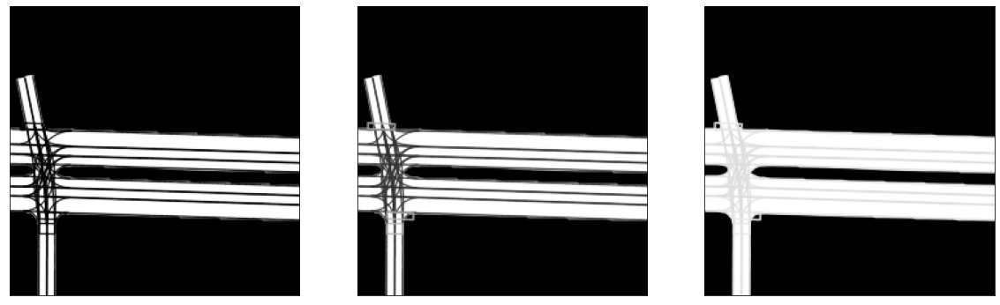

In [123]:
map_sem = eval_dataset[100]["image"][22:]
f, ax = plt.subplots(1, 3, figsize=(20, 10))

ax = ax.flatten()

for i in range(3):
    ax[i].imshow(map_sem[i], cmap='Greys')
    ax[i].get_xaxis().set_visible(False)
    ax[i].get_yaxis().set_visible(False)

[[ True  True  True ...  True  True  True]
 [ True  True  True ...  True  True  True]
 [ True  True  True ...  True  True  True]
 ...
 [ True  True  True ...  True  True  True]
 [ True  True  True ...  True  True  True]
 [ True  True  True ...  True  True  True]]


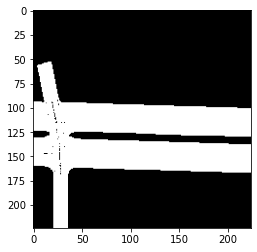

In [135]:
non_road = np.any(map_sem == 1, axis = 0)
print(non_road)
plt.imshow(non_road, cmap='Greys')

In [78]:
eval_dataset[100].keys()

dict_keys(['image', 'target_positions', 'target_yaws', 'target_availabilities', 'history_positions', 'history_yaws', 'history_availabilities', 'world_to_image', 'raster_from_world', 'raster_from_agent', 'agent_from_world', 'world_from_agent', 'track_id', 'timestamp', 'centroid', 'yaw', 'extent'])

In [118]:
eval_dataset[100]["history_positions"]

array([[ 1.1368684e-13,  0.0000000e+00],
       [-1.5116149e+00, -6.1595153e-02],
       [-3.0406401e+00, -9.1887027e-02],
       [-4.5581484e+00, -1.5601538e-01],
       [-6.0863976e+00, -2.0035787e-01],
       [-7.6170974e+00, -2.4595200e-01],
       [-9.1484900e+00, -3.0122599e-01],
       [-1.0656441e+01, -3.3913910e-01],
       [-1.2166039e+01, -3.5850036e-01],
       [-1.3671242e+01, -4.0406531e-01],
       [-1.5182408e+01, -4.5897382e-01]], dtype=float32)

In [93]:
origin_frame = eval_dataset[100]['image'][0].copy()

In [113]:
new_frame = origin_frame > 0

In [114]:
keys, counts = np.unique(new_frame, return_counts=True)
for key, count in zip(keys, counts):
    print(f'{key:.3f}: {count}')

0.000: 49383
1.000: 793


In [115]:
print(single_frame.shape)
print(len(np.unique(single_frame)))

(224, 224)
2


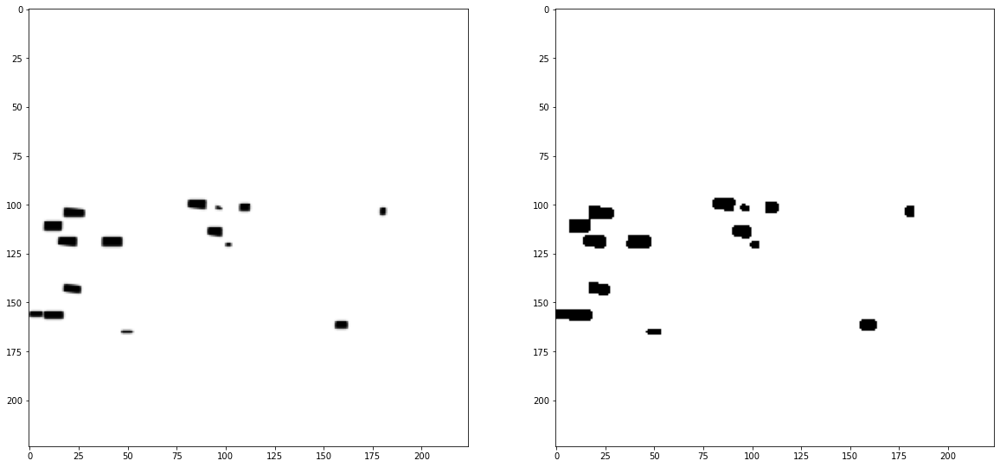

In [116]:
f, ax = plt.subplots(1, 2, figsize=(20, 20))
ax = ax.flatten()
ax[0].imshow(origin_frame, cmap='Greys')
ax[1].imshow(new_frame, cmap='Greys')

In [23]:
LABELS = [0] * 3
TL_FACE_LABELS = [0] * 3
SCENE_DTYPE = [
    ("frame_index_interval", np.int64, (2,)),
    ("host", "<U16"),  # Unicode string up to 16 chars
    ("start_time", np.int64),
    ("end_time", np.int64),
]

FRAME_DTYPE = [
    ("timestamp", np.int64),
    ("agent_index_interval", np.int64, (2,)),
    ("traffic_light_faces_index_interval", np.int64, (2,)),
    ("ego_translation", np.float64, (3,)),
    ("ego_rotation", np.float64, (3, 3)),
]

AGENT_DTYPE = [
    ("centroid", np.float64, (2,)),
    ("extent", np.float32, (3,)),
    ("yaw", np.float32),
    ("velocity", np.float32, (2,)),
    ("track_id", np.uint64),
    ("label_probabilities", np.float32, (len(LABELS),)),
]

TL_FACE_DTYPE = [
    ("face_id", "<U16"),
    ("traffic_light_id", "<U16"),
    ("traffic_light_face_status", np.float32, (len(TL_FACE_LABELS,))),
]

In [26]:
dt = eval_zarr
scenes = dt.scenes
frames = dt.frames
agents = dt.agents
tl_faces = dt.tl_faces

In [41]:
def build_df(data, features, data_name):
    df = pd.DataFrame(data)
    df.columns = ["data"]
    for i, feature in enumerate(features):
        df[feature] = df["data"].apply(lambda x: x[i])
    df.drop(columns=["data"], inplace=True)
    print(f"{data_name} dataset: {df.shape}")
    return df

In [43]:
# scenes_features = ['timestamp', 'agent_index_interval', 'traffic_light_faces_index_interval', 'ego_translation', 'ego_rotation']
scenes_features = ['frame_index_interval', 'host', 'start_time', 'end_time']
scenes_df = build_df(scenes, scenes_features, 'scenes')
scenes_df.head()

scenes dataset: (100, 4)


,frame_index_interval,host,start_time,end_time
0,"[0, 100]",host-a013,1572643684617362176,1572643709617362176
1,"[100, 200]",host-a013,1572643749559148288,1572643774559148288
2,"[200, 300]",host-a013,1572643774559148288,1572643799559148288
3,"[300, 400]",host-a013,1572643799559148288,1572643824559148288
4,"[400, 500]",host-a013,1572643824559148288,1572643849559148288


In [57]:
print(scenes_df["host"].unique())

array(['host-a013', 'host-a101'], dtype=object)

In [44]:
frames_features = ['timestamp', 'agent_index_interval', 'traffic_light_faces_index_interval', 'ego_translation', 'ego_rotation']
frames_df = build_df(frames, frames_features, 'frames')
frames_df.head()

frames dataset: (10000, 5)


,timestamp,agent_index_interval,traffic_light_faces_index_interval,ego_translation,ego_rotation
0,1572643684801892606,"[0, 38]","[0, 0]","[680.6197509765625, -2183.32763671875, 288.541...","[[0.5467331409454346, -0.837294340133667, 0.00..."
1,1572643684901714926,"[38, 85]","[0, 0]","[681.1856079101562, -2182.42236328125, 288.608...","[[0.5470812916755676, -0.837059736251831, 0.00..."
2,1572643685001499246,"[85, 142]","[0, 0]","[681.7647094726562, -2181.522705078125, 288.68...","[[0.5479603409767151, -0.8364874720573425, 0.0..."
3,1572643685101394026,"[142, 200]","[0, 0]","[682.3414306640625, -2180.624267578125, 288.75...","[[0.5491225123405457, -0.8357341885566711, 0.0..."
4,1572643685201412346,"[200, 254]","[0, 0]","[682.9197998046875, -2179.73046875, 288.827392...","[[0.5504215955734253, -0.8348868489265442, -7...."


In [46]:
agents_features = ['centroid', 'extent', 'yaw', 'velocity', 'track_id', 'label_probabilities']
agents_df = build_df(agents, agents_features, 'agents')
agents_df.head()

agents dataset: (751440, 6)


,centroid,extent,yaw,velocity,track_id,label_probabilities
0,"[665.0342407226562, -2207.51220703125]","[4.3913283, 1.8138304, 1.5909758]",1.016675,"[0.0, 0.0]",1,"[0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 0.0, 0.0, ..."
1,"[717.6612548828125, -2173.760009765625]","[5.150925, 1.9530917, 2.04021]",-0.783224,"[0.0, 0.0]",2,"[0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 0.0, 0.0, ..."
2,"[730.681396484375, -2180.678955078125]","[2.9482825, 1.4842174, 1.1125067]",-0.321747,"[0.0, 0.0]",3,"[0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 0.0, 0.0, ..."
3,"[671.2536010742188, -2204.745361328125]","[1.7067024, 0.9287868, 0.6282158]",0.785501,"[0.0, 0.0]",4,"[0.0, 1.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ..."
4,"[669.7763061523438, -2213.004638671875]","[0.25109944, 0.6343781, 1.654377]",1.492359,"[0.0, 0.0]",5,"[0.0, 1.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ..."


In [48]:
tl_faces_features = ["face_id", "traffic_light_id", "traffic_light_face_status"]
tl_faces_df = build_df(tl_faces, tl_faces_features, 'tl_faces')
tl_faces_df.head()

tl_faces dataset: (130740, 3)


,face_id,traffic_light_id,traffic_light_face_status
0,xbVG,/ggb,"[0.0, 0.0, 1.0]"
1,jutE,/ggb,"[0.0, 0.0, 1.0]"
2,CDDo,/ggb,"[0.0, 0.0, 1.0]"
3,xbVG,/ggb,"[0.0, 0.0, 1.0]"
4,jutE,/ggb,"[0.0, 0.0, 1.0]"


In [55]:
print(f"number of traffic_light_id: {len(tl_faces_df['traffic_light_id'].unique())}")
print(f"number of face_id: {len(tl_faces_df['face_id'].unique())}")

number of traffic_light_id: 76
number of face_id: 228


11.231639


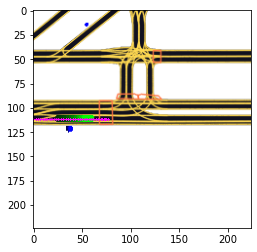

0.021718852


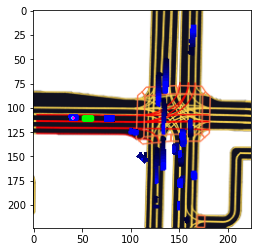

0.02218477


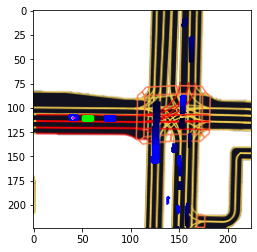

0.02798549


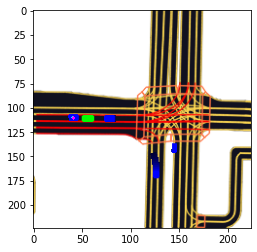

0.27652428


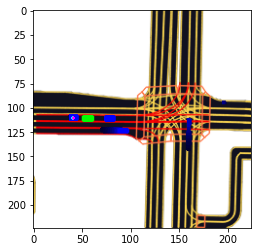

8.748563


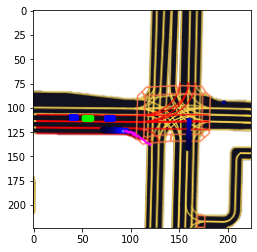

0.2719491


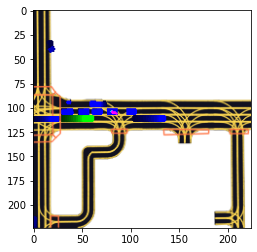

0.4756176


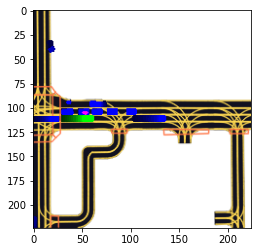

0.3047337


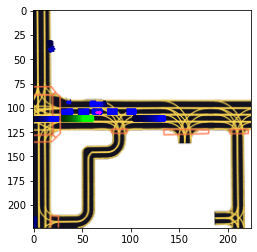

0.8024143


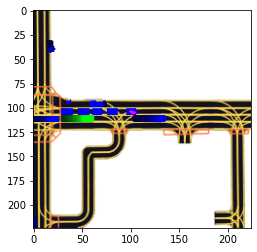

5.048487


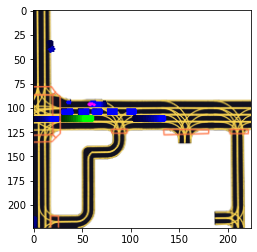

5.5383034


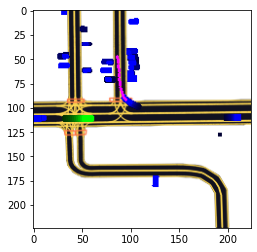

0.86490315


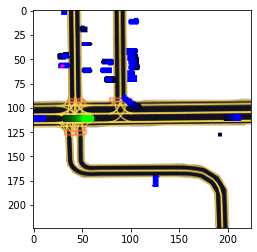

0.091047905


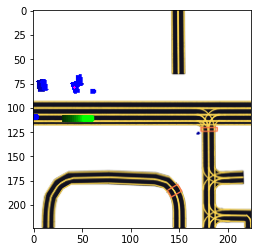

0.09118045


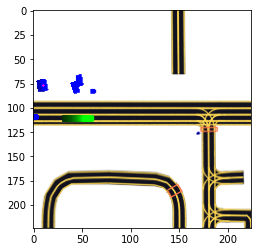

0.45497176


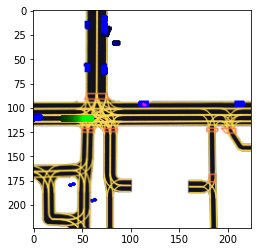

0.35005656


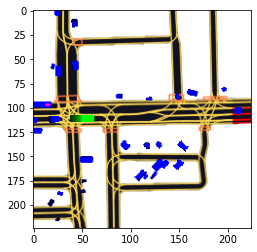

0.26353317


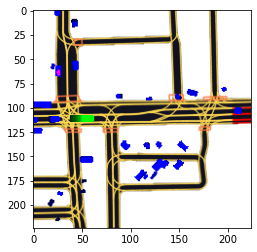

0.066770166


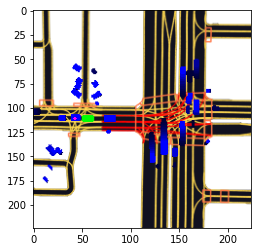

0.19086973


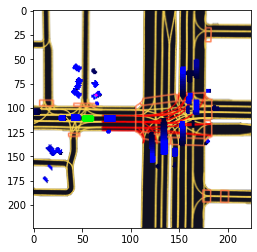

0.08751619


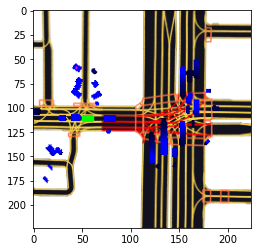

0.115898475


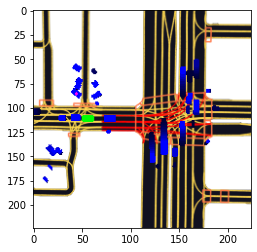

0.39288145


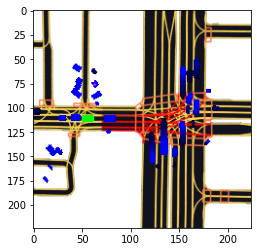

0.41261518


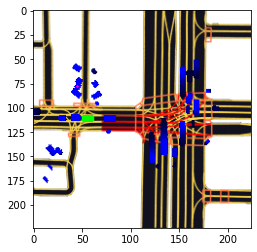

0.0901818


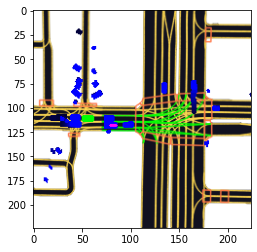

0.1440607


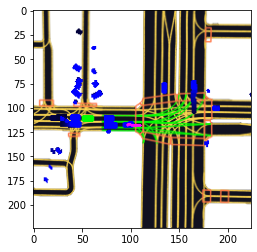

0.10109476


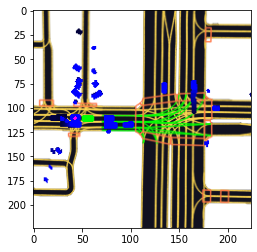

0.73520374


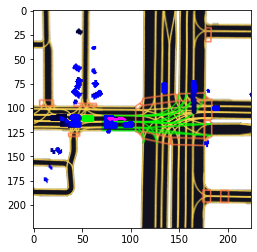

0.68146724


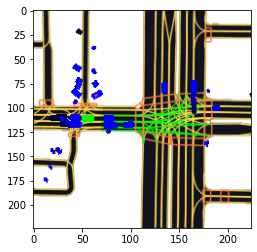

0.05448152


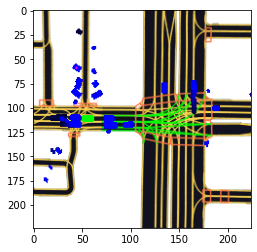

0.33798373


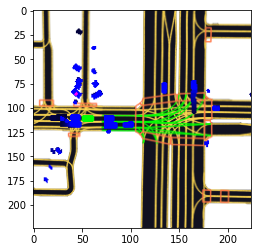

0.3174381


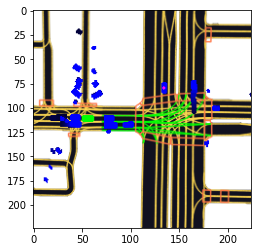

0.313014


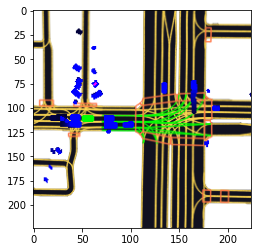

0.2736461


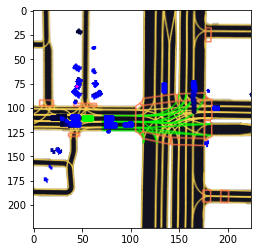

0.43936467


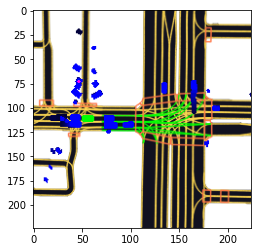

5.267093


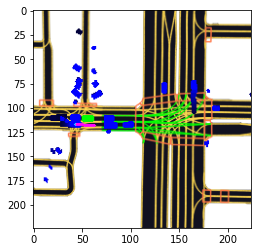

2.0078228


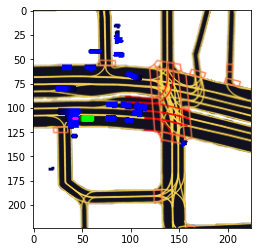

0.7324374


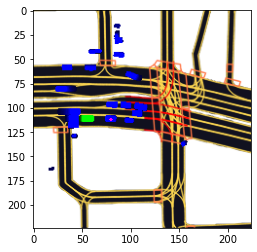

6.519251


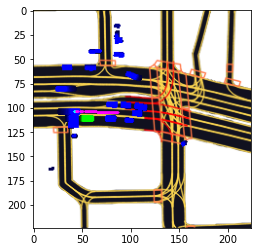

0.19981308


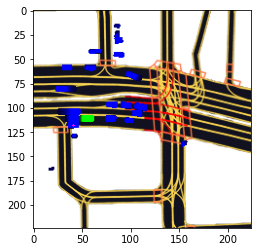

0.57888097


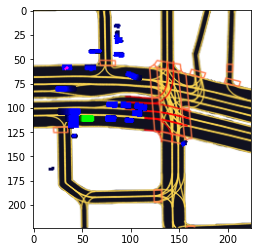

0.40140766


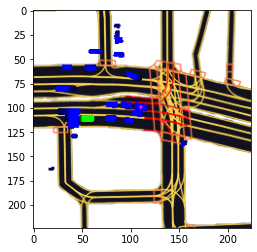

0.11828015


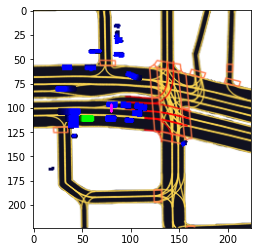

0.15146793


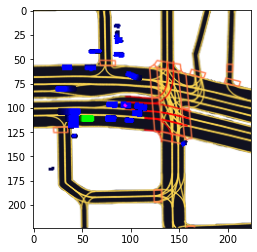

0.46306795


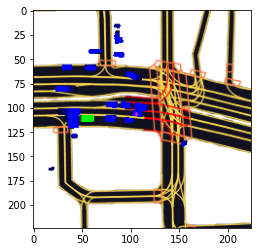

4.9735928


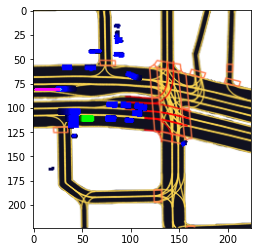

0.020109423


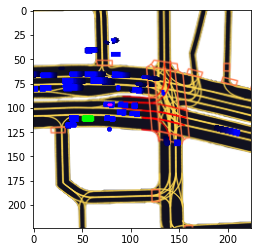

0.09325731


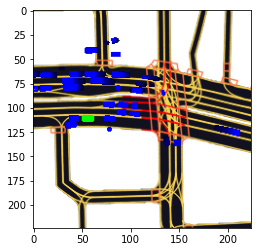

0.07176113


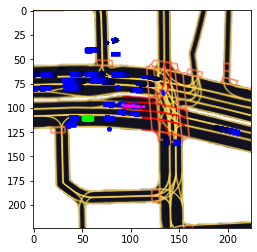

0.07994509


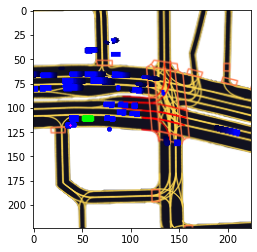

0.02003906


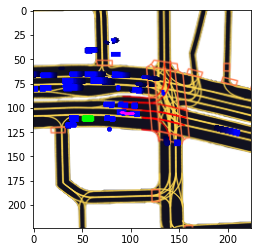

0.1349117


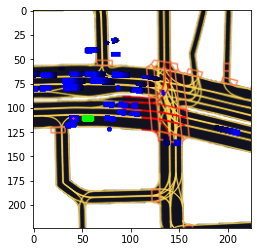

0.54034305


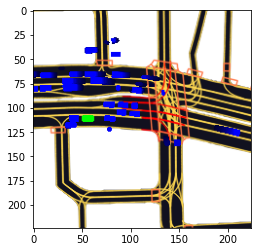

0.09741473


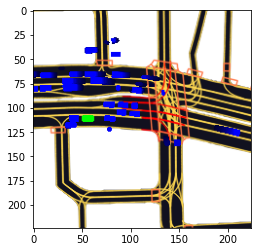

0.19520658


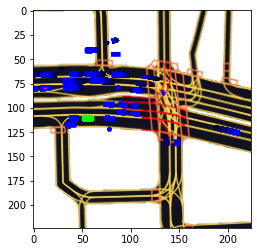

3.2067723


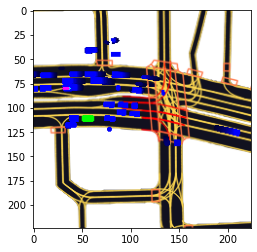

3.485239


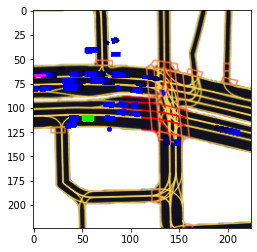

6.4015284


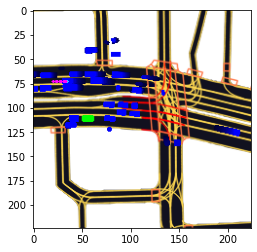

5.021355


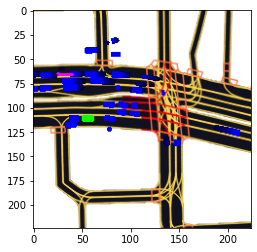

5.2060413


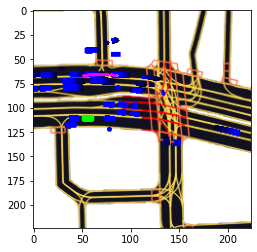

0.49318975


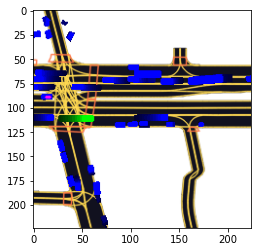

13.843554


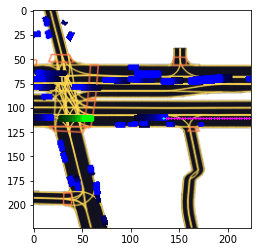

0.41120753


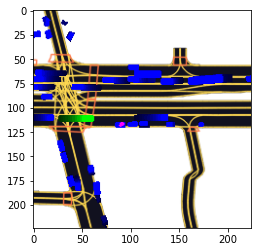

9.727175


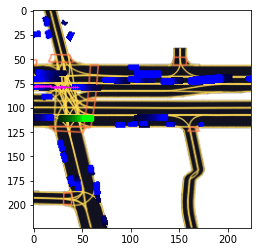

0.43191433


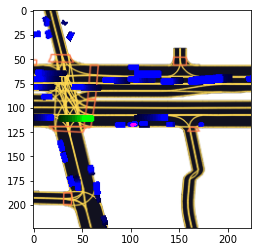

5.6810746


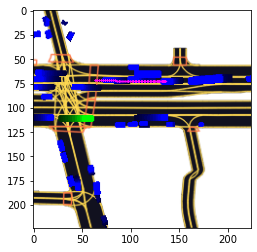

3.0753531


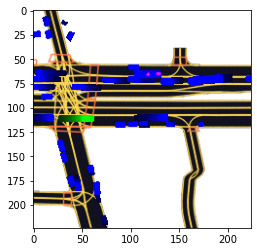

8.865483


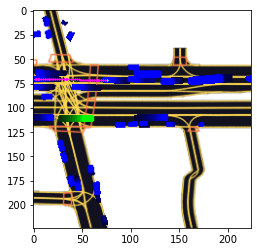

10.967222


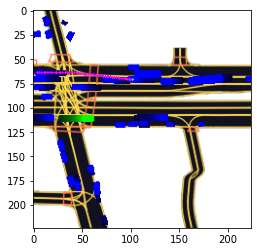

0.09345679


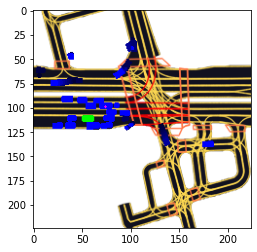

0.27908516


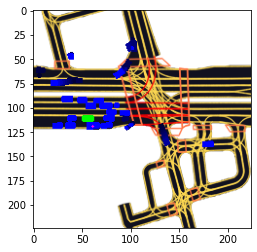

0.046129655


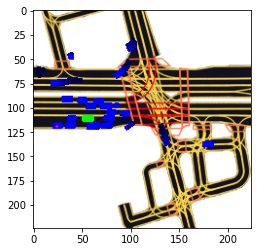

0.16738673


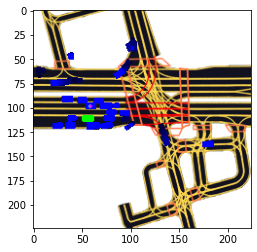

0.060405605


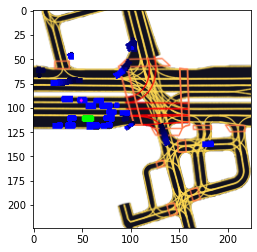

0.026454475


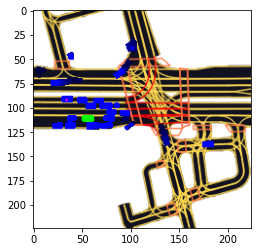

0.15492088


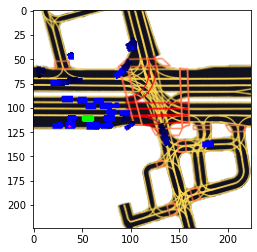

0.41408563


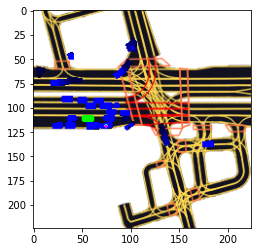

0.054577164


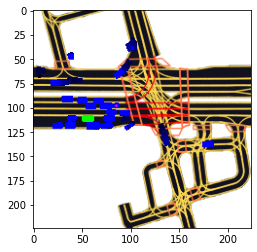

0.0945323


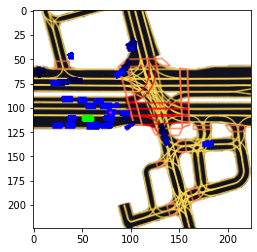

0.14168985


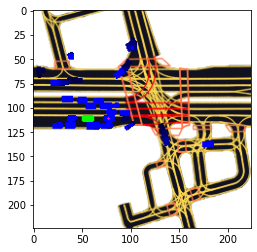

0.039966986


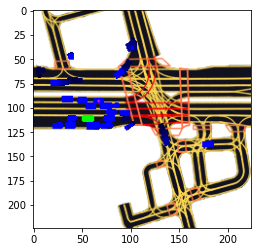

13.947779


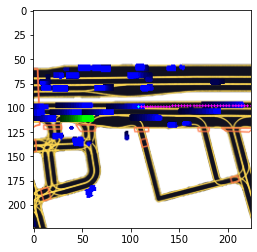

13.803433


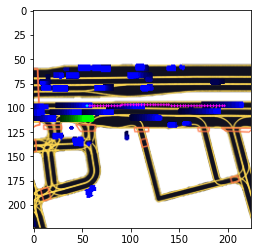

11.584064


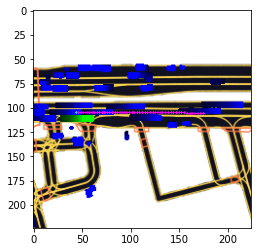

11.624994


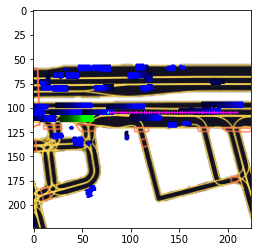

12.881374


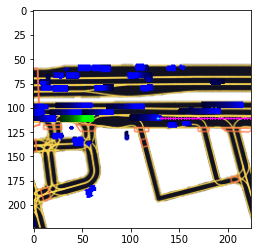

0.68775535


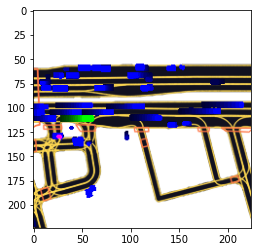

1.1220903


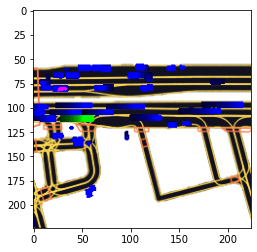

0.6263096


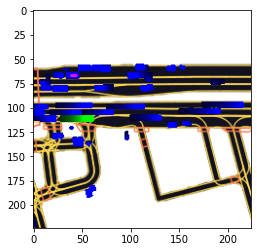

4.7728596


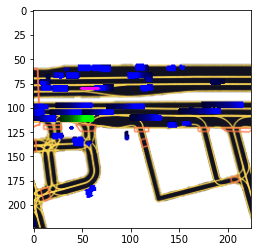

10.120768


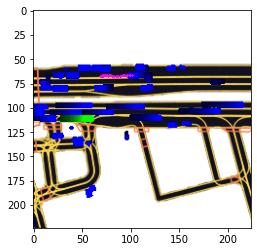

2.6467285


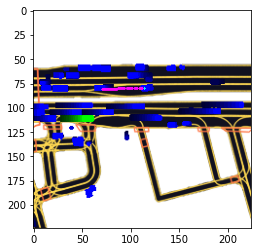

16.446865


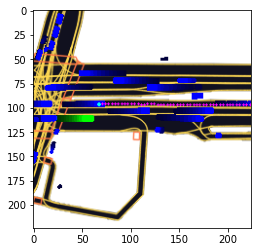

15.77995


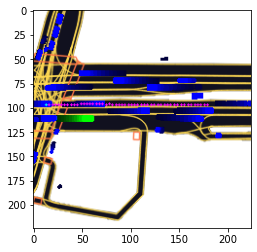

19.185822


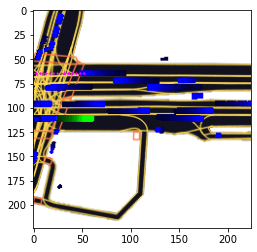

17.08324


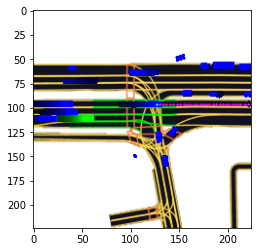

14.845345


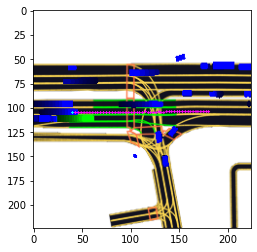

17.458603


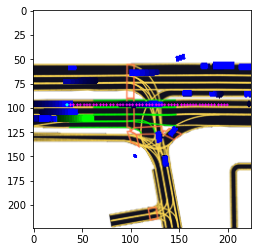

0.4567413


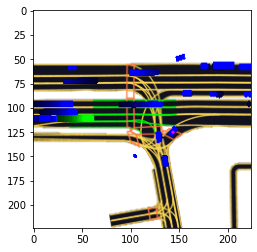

1.0428473


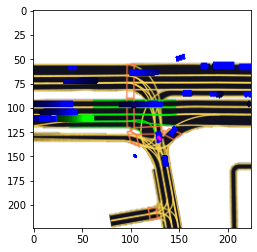

15.189924


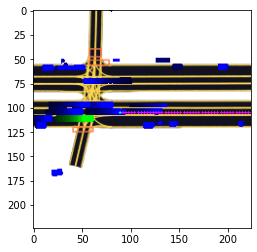

1.4229099


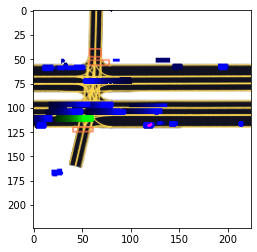

13.989525


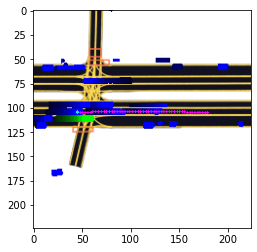

15.980129


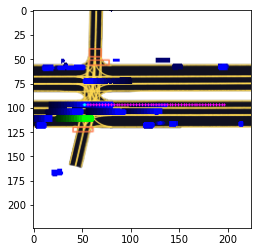

15.479394


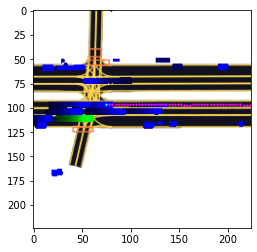

0.041807353


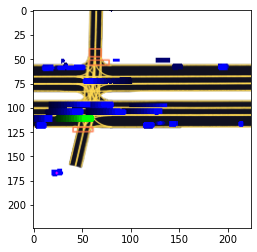

14.947796


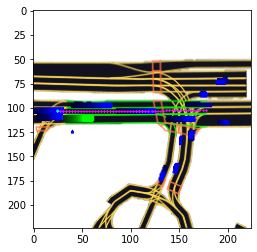

16.105003


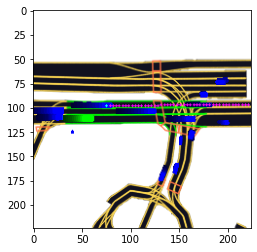

0.14233059


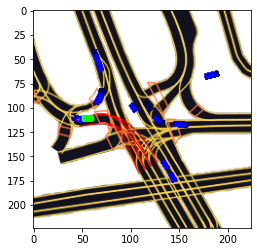

0.13311535


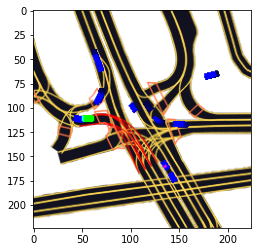

3.3560653


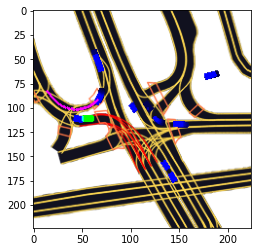

0.3032381


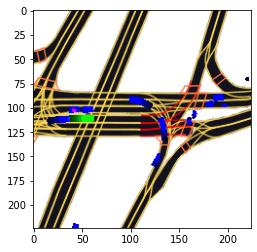

0.2556089


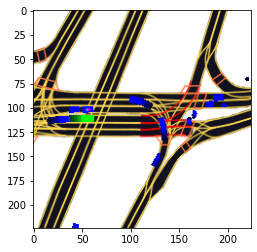

6.279689


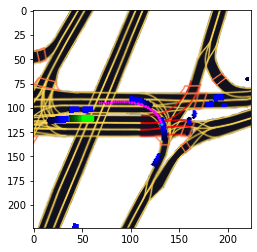

6.5146503


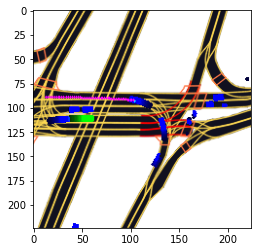

0.122875534


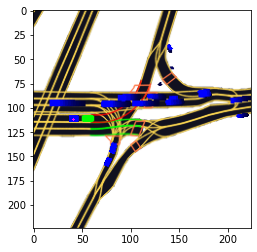

13.132817


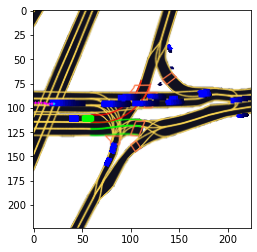

9.494893


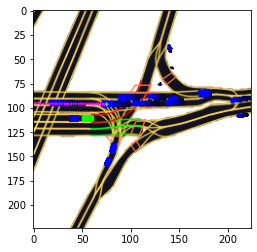

8.541264


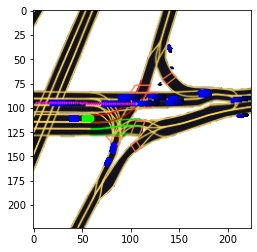

0.07481683


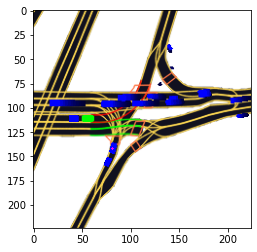

0.18497431


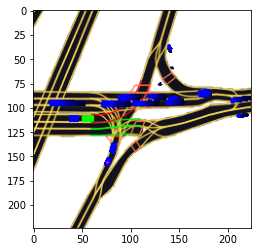

0.05922255


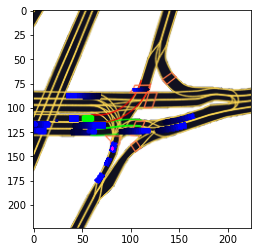

0.07447656


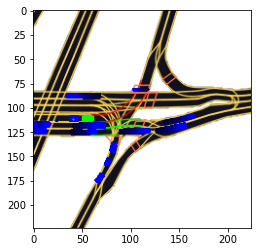

12.29955


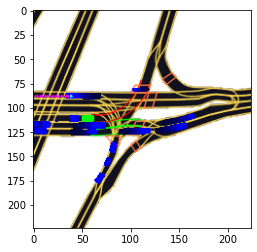

10.718721


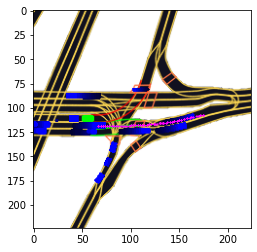

7.7850375


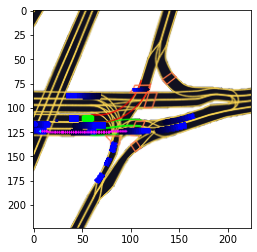

8.564968


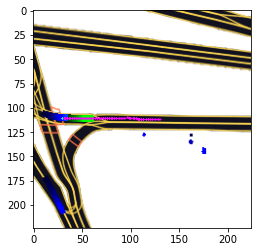

14.069032


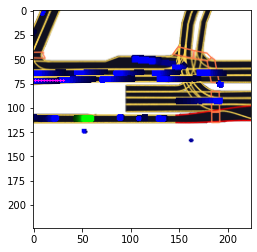

12.607352


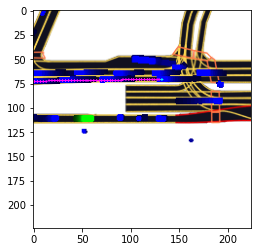

0.38513976


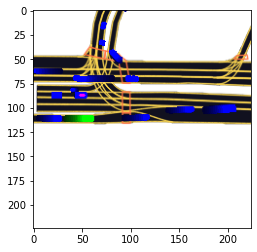

0.13837564


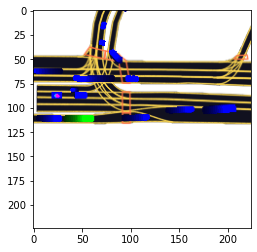

8.352095


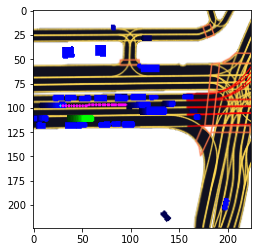

7.1513753


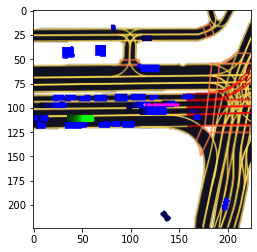

0.14830056


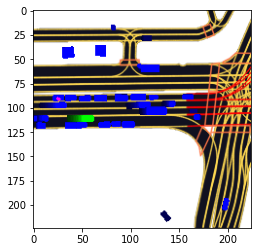

0.2612745


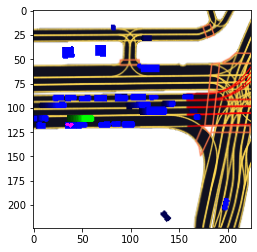

0.2414077


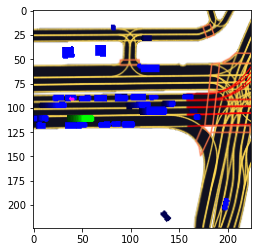

0.32966942


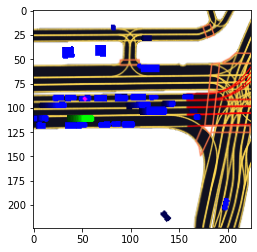

0.45771205


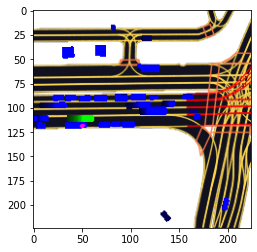

0.3749956


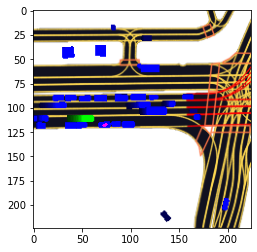

0.2621792


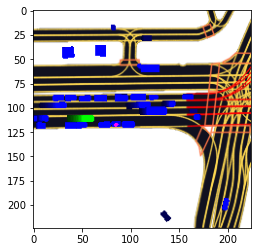

0.26491672


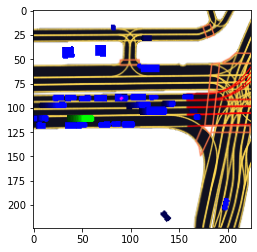

0.6426811


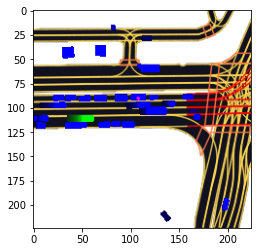

0.32947177


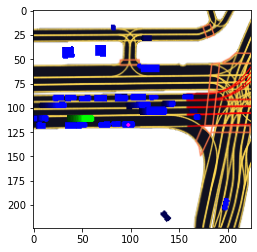

0.10742971


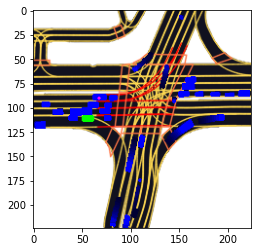

0.07923436


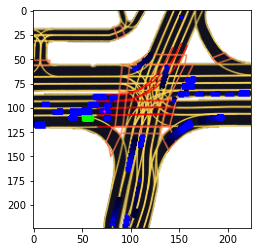

0.07165691


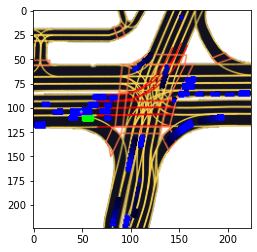

0.03714055


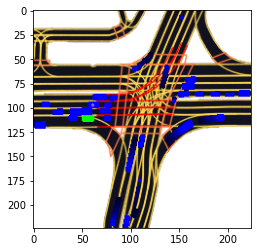

0.08404046


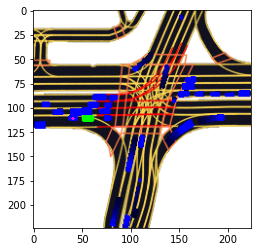

0.024357127


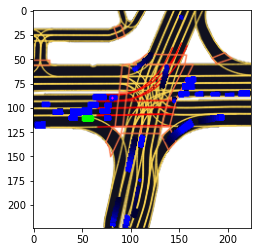

0.03401271


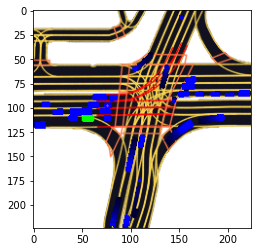

0.20994014


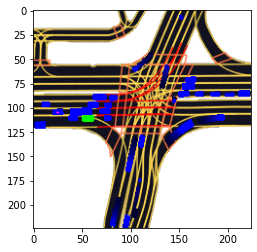

0.23363975


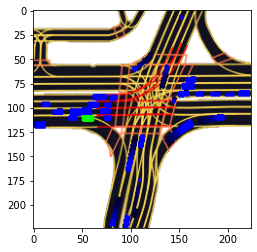

12.708067


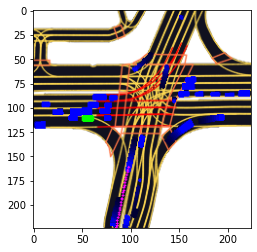

1.0958691


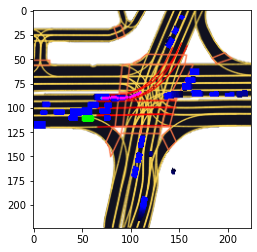

0.11319353


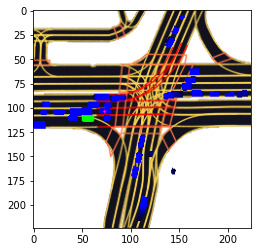

0.05270117


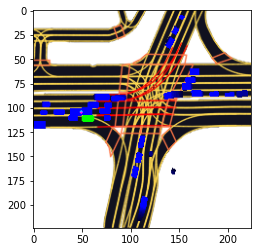

0.013847127


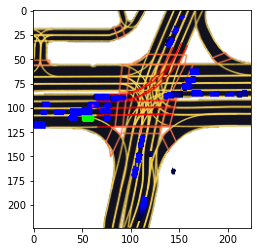

1.2784183


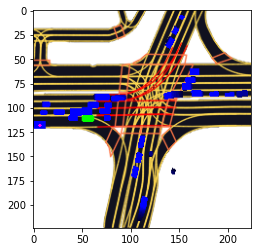

0.1123367


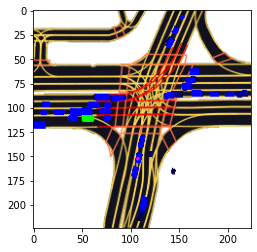

0.021780925


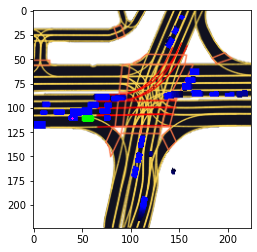

0.03965562


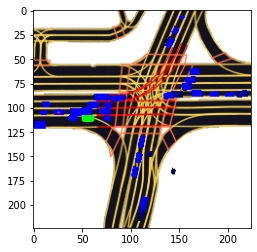

0.018808253


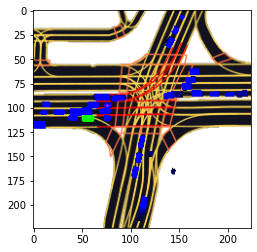

0.22356205


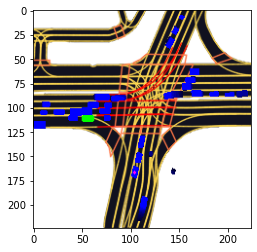

0.09140201


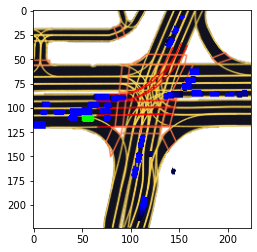

8.602739


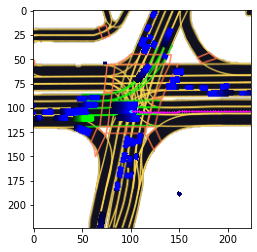

3.1786864


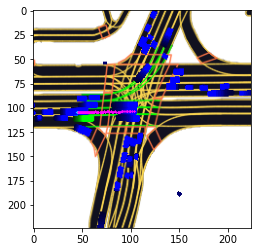

4.4788866


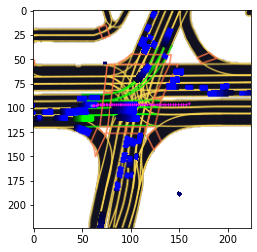

0.15554975


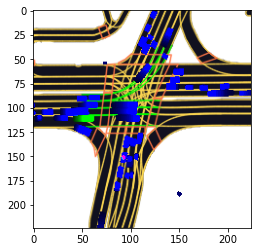

0.14090116


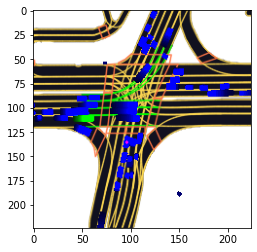

8.540088


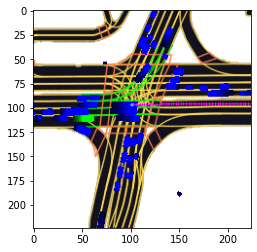

2.6027052


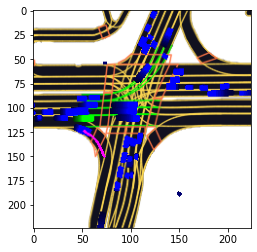

0.3002196


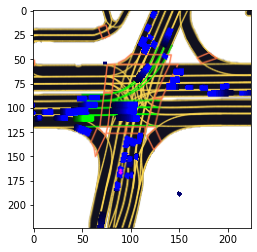

1.3624895


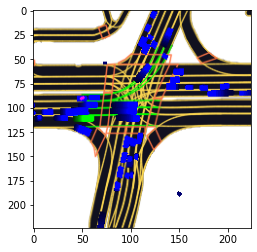

18.314547


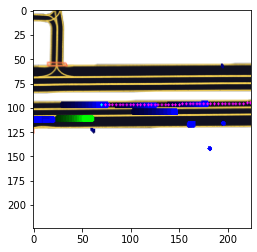

18.57236


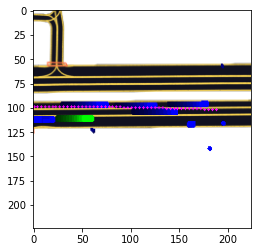

16.2425


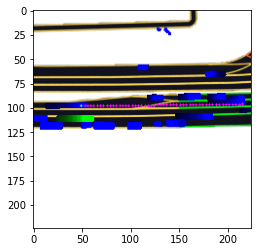

3.764987


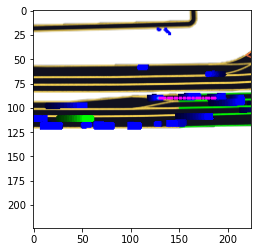

1.9511261


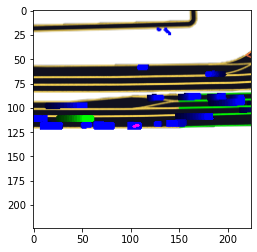

1.078591


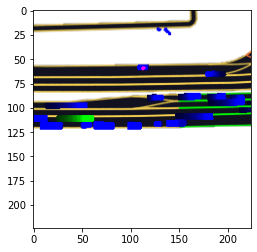

18.40015


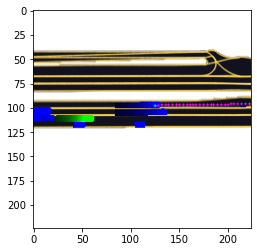

0.60828143


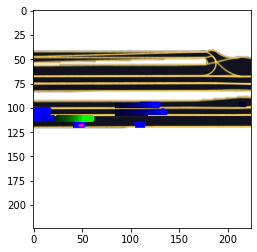

0.85743076


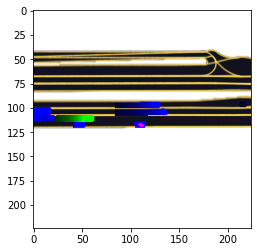

4.976939


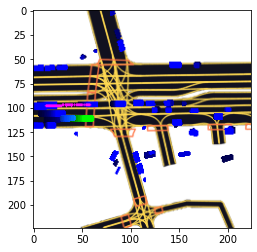

8.674349


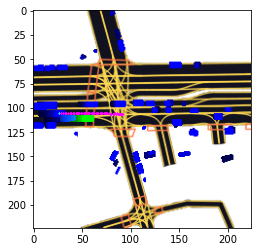

11.222712


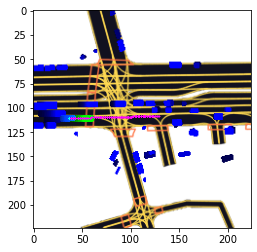

4.946012


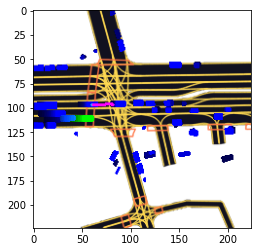

2.720808


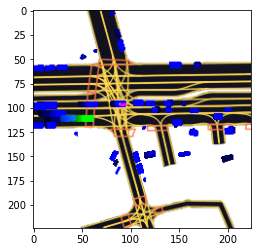

1.3456781


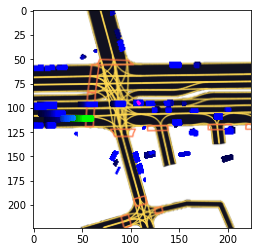

0.77442616


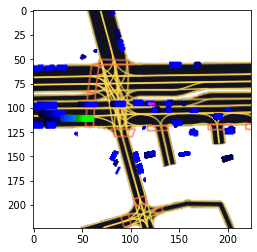

1.1649454


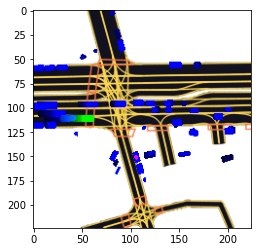

0.32128257


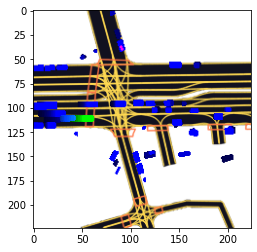

4.672561


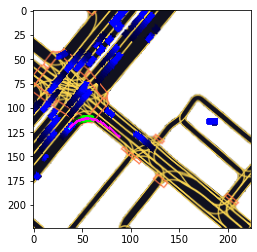

11.719765


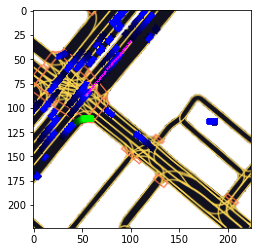

10.661377


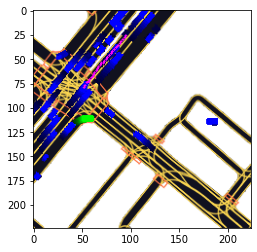

0.4943462


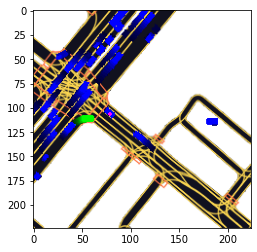

9.706238


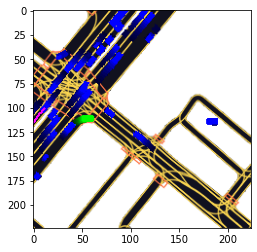

8.452156


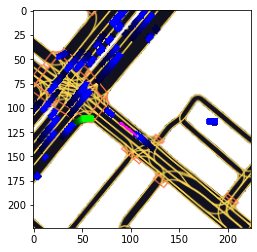

6.444517


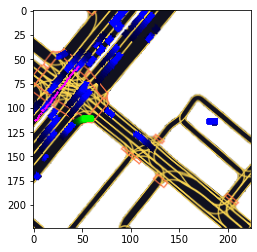

1.0765595


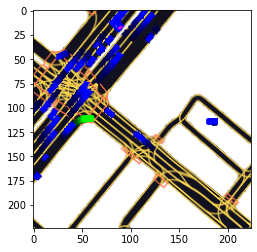

0.17418426


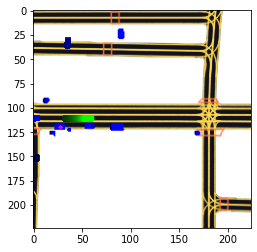

0.36226228


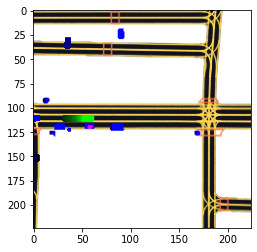

0.946252


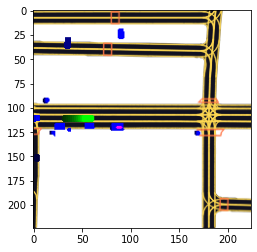

2.2171462


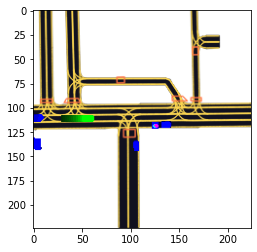

2.792345


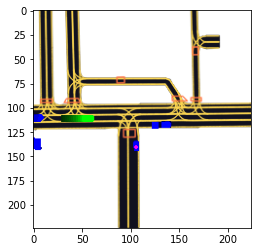

0.0032046554


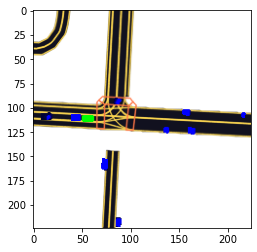

0.1174608


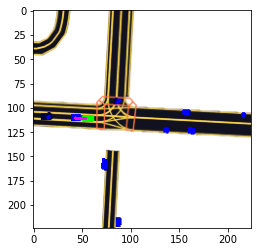

0.08764353


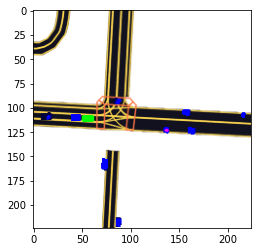

0.003517126


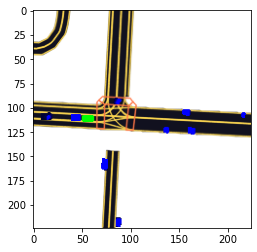

0.25959054


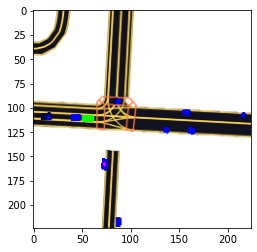

In [143]:
model.eval()
torch.set_grad_enabled(False)
device = "cuda:0"
model.to(device)
# build a dict to retrieve future trajectories from GT
gt_rows = {}
for row in read_gt_csv(eval_gt_path):
    gt_rows[row["track_id"] + row["timestamp"]] = row["coord"]

eval_ego_dataset = EgoDataset(cfg, eval_dataset.dataset, rasterizer)

for frame_number in range(99, 99+100*50, 100):  # start from last frame of scene_0 and increase by 100
    agent_indices = eval_dataset.get_frame_indices(frame_number) 
    if not len(agent_indices):
        continue

    # get AV point-of-view frame
    data_ego = eval_ego_dataset[frame_number]
    im_ego = rasterizer.to_rgb(data_ego["image"].transpose(1, 2, 0))
    center = np.asarray(cfg["raster_params"]["ego_center"]) * cfg["raster_params"]["raster_size"]
    
    for v_index in agent_indices:
        img = im_ego.copy()
        
        predicted_positions = []
        target_positions = []
        
        data_agent = eval_dataset[v_index]

        out_net = model(torch.from_numpy(data_agent["image"]).unsqueeze(0).to(device))
        out_pos = out_net[0].reshape(-1, 2).detach().cpu().numpy()
        
        # store absolute world coordinates
        h_pos = data_agent["history_positions"]
        history_move = np.sum(np.sum((h_pos[:-1] - h_pos[1:])**2, axis=1) ** 0.5 )
        print(history_move)
#         if history_move < 1:
#             out_pos = np.tile([data_agent["history_positions"][0]], (len(out_pos), 1) ,)
        
        
        predicted_positions.append(transform_points(out_pos, data_agent["world_from_agent"]))
        # retrieve target positions from the GT and store as absolute coordinates
        track_id, timestamp = data_agent["track_id"], data_agent["timestamp"]
        target_positions.append(gt_rows[str(track_id) + str(timestamp)] + data_agent["centroid"][:2])
        
        # convert coordinates to AV point-of-view so we can draw them
        predicted_positions = transform_points(np.concatenate(predicted_positions), data_ego["raster_from_world"])
        target_positions = transform_points(np.concatenate(target_positions), data_ego["raster_from_world"])
#         print(target_positions)
        
        draw_trajectory(img, predicted_positions, PREDICTED_POINTS_COLOR)
        draw_trajectory(img, target_positions, TARGET_POINTS_COLOR)

        plt.imshow(img[::-1])
        plt.show()

In [24]:
agent_indices = eval_dataset.get_frame_indices(599) 
agent_indices

array([4, 5])

In [25]:
data_agent = eval_dataset[4]

In [37]:
data_agent.keys()

dict_keys(['image', 'target_positions', 'target_yaws', 'target_availabilities', 'history_positions', 'history_yaws', 'history_availabilities', 'world_to_image', 'raster_from_world', 'raster_from_agent', 'agent_from_world', 'world_from_agent', 'track_id', 'timestamp', 'centroid', 'yaw', 'extent'])

In [39]:
data_agent['history_positions'][0] 

array([0.0000000e+00, 1.1368684e-13], dtype=float32)

In [58]:
np.tile([data_agent["history_positions"][0]], (len(out_pos), 1) ,)

array([[0., 0.],
       [0., 0.],
       [0., 0.],
       [0., 0.],
       [0., 0.],
       [0., 0.],
       [0., 0.],
       [0., 0.],
       [0., 0.],
       [0., 0.],
       [0., 0.],
       [0., 0.],
       [0., 0.],
       [0., 0.],
       [0., 0.],
       [0., 0.],
       [0., 0.],
       [0., 0.],
       [0., 0.],
       [0., 0.],
       [0., 0.],
       [0., 0.],
       [0., 0.],
       [0., 0.],
       [0., 0.],
       [0., 0.],
       [0., 0.],
       [0., 0.],
       [0., 0.],
       [0., 0.],
       [0., 0.],
       [0., 0.],
       [0., 0.],
       [0., 0.],
       [0., 0.],
       [0., 0.],
       [0., 0.],
       [0., 0.],
       [0., 0.],
       [0., 0.],
       [0., 0.],
       [0., 0.],
       [0., 0.],
       [0., 0.],
       [0., 0.],
       [0., 0.],
       [0., 0.],
       [0., 0.],
       [0., 0.],
       [0., 0.],
       [0., 0.],
       [0., 0.],
       [0., 0.],
       [0., 0.],
       [0., 0.],
       [0., 0.],
       [0., 0.],
       [0., 0.],
       [0., 0.

In [56]:
data_agent["history_positions"]

array([[ 0.0000000e+00,  0.0000000e+00],
       [-1.4693557e-03, -8.7270926e-04],
       [-6.5898284e-04, -2.2371109e-03],
       [-5.9982651e-04, -3.0538440e-03],
       [-7.7665702e-04, -5.1465635e-03],
       [-7.8683562e-04, -2.7389820e-03],
       [-1.3217841e-03, -6.4308255e-04],
       [-4.5893426e-04, -1.9763161e-03],
       [-1.7969140e-04, -5.0759576e-03],
       [ 5.1936740e-04, -7.9262536e-03],
       [ 4.4213615e-05, -1.1190006e-02]], dtype=float32)